In [2]:
import pandas as pd
import shap
import matplotlib as plt
import seaborn as sns
import json
import catboost
from catboost import Pool, CatBoostClassifier,cv
from sklearn.metrics import confusion_matrix
import sklearn.metrics as metrics
from sklearn.model_selection import train_test_split

In [3]:
# data
X = pd.read_pickle('X.pkl')
Y = pd.read_pickle('Y.pkl')

In [7]:
df_y=Y.copy()

In [8]:
df_y.loc[df_y=='HP']=0
df_y.loc[df_y=='OppHP']=1
df_y.loc[df_y=='NonHP']=2

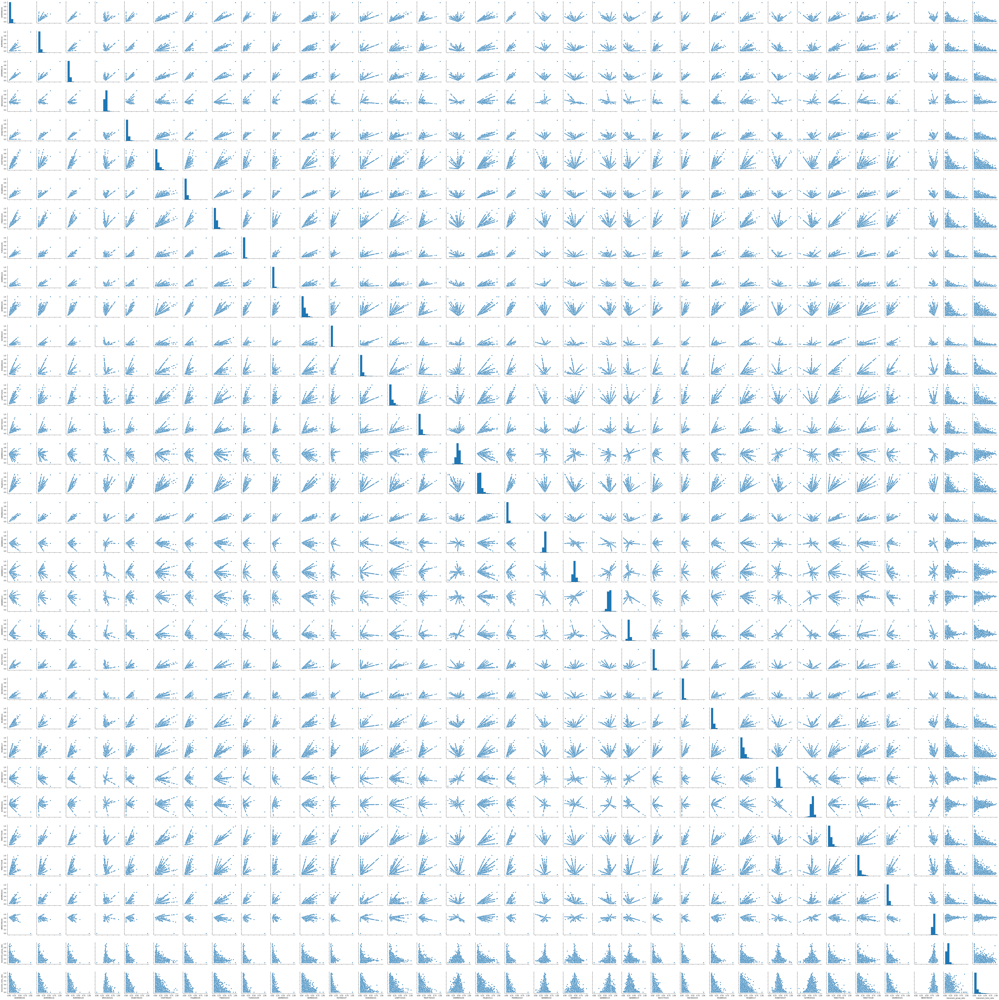

In [185]:
#data summary
sns.pairplot(X)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f8cac57bb70>,
      dtype=object)

<Figure size 1440x864 with 0 Axes>

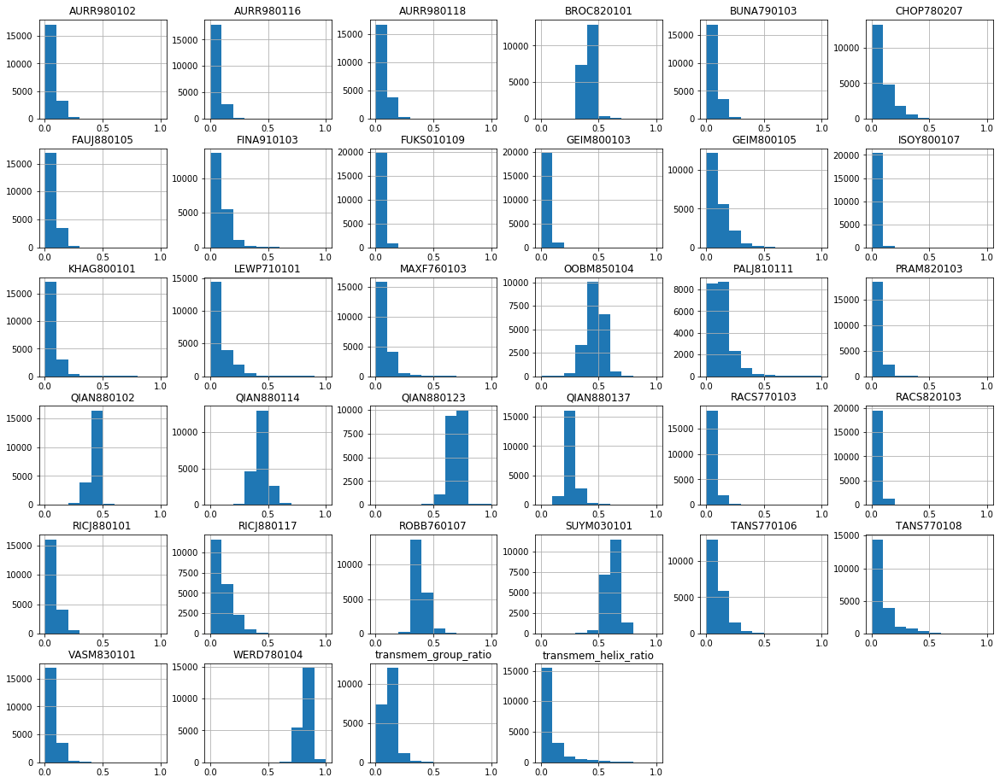

In [183]:
#data hist summary
plt.pyplot.subplots_adjust(hspace=0.8)
plt.rcParams['figure.subplot.hspace']=0.8
plt.rcParams['figure.figsize']= [20.0, 16.0]
X.hist()

In [9]:
#rebalance using over sampling
from imblearn.over_sampling import RandomOverSampler

ros = RandomOverSampler(random_state=0)
X_resample, y_resample = ros.fit_resample(X, df_y)
X_resample = pd.DataFrame(X_resample)
y_resample = pd.DataFrame(y_resample)

In [10]:
seed = 7
test_size = 0.33

# split data into train dataset and test dataset 
X_train, X_test, y_train, y_test =train_test_split(X_resample, y_resample, test_size=test_size, random_state=seed)

In [11]:

train_dataset = Pool(data=X_train,label=y_train)

In [14]:

model = CatBoostClassifier(iterations = 1000,
                           learning_rate=0.03,                           
                           depth=6,
                           train_dir = "./bio-catboost-multi-resample",
                           custom_metric=['Precision','Recall','F1','Accuracy','MCC'],
                           loss_function='MultiClass')

In [17]:
# Fit model
model.fit(train_dataset,eval_set=Pool(data=X_test,label=y_test))

0:	learn: 1.0855170	test: 1.0855122	best: 1.0855122 (0)	total: 192ms	remaining: 3m 11s
1:	learn: 1.0728854	test: 1.0730078	best: 1.0730078 (1)	total: 272ms	remaining: 2m 15s
2:	learn: 1.0610786	test: 1.0612524	best: 1.0612524 (2)	total: 359ms	remaining: 1m 59s
3:	learn: 1.0505631	test: 1.0508681	best: 1.0508681 (3)	total: 453ms	remaining: 1m 52s
4:	learn: 1.0391118	test: 1.0394621	best: 1.0394621 (4)	total: 550ms	remaining: 1m 49s
5:	learn: 1.0304624	test: 1.0309251	best: 1.0309251 (5)	total: 648ms	remaining: 1m 47s
6:	learn: 1.0202694	test: 1.0208425	best: 1.0208425 (6)	total: 744ms	remaining: 1m 45s
7:	learn: 1.0113532	test: 1.0119111	best: 1.0119111 (7)	total: 838ms	remaining: 1m 43s
8:	learn: 1.0044041	test: 1.0049826	best: 1.0049826 (8)	total: 936ms	remaining: 1m 43s
9:	learn: 0.9959200	test: 0.9965470	best: 0.9965470 (9)	total: 1.03s	remaining: 1m 41s
10:	learn: 0.9882816	test: 0.9888448	best: 0.9888448 (10)	total: 1.12s	remaining: 1m 41s
11:	learn: 0.9822199	test: 0.9827913	best

In [18]:
model.save_model('bio_catboost_multi_resample.model')

In [20]:
model.get_best_score()

{'learn': {'MCC': 0.8440994659905133,
  'F1:class=2': 0.867814899356713,
  'F1:class=0': 0.8261665141811528,
  'Recall:class=0': 0.7437106918238994,
  'Recall:class=2': 0.9346692491060786,
  'Precision:class=1': 0.958297629248786,
  'Precision:class=2': 0.8099418979987089,
  'Precision:class=0': 0.9292068545743983,
  'Recall:class=1': 1.0,
  'F1:class=1': 0.9787047841306884,
  'MultiClass': 0.3533401206187479,
  'Accuracy': 0.8930099502487562},
 'validation': {'MCC': 0.8246845386769088,
  'F1:class=2': 0.8493609888958726,
  'F1:class=0': 0.8032135306553911,
  'Recall:class=0': 0.714780252859723,
  'Recall:class=2': 0.9247262773722628,
  'Precision:class=1': 0.9580663948747816,
  'Precision:class=2': 0.7853545137543588,
  'Precision:class=0': 0.9166184134337001,
  'Recall:class=1': 1.0,
  'F1:class=1': 0.9785841760856633,
  'MultiClass': 0.3693303138881446,
  'Accuracy': 0.8792929292929293}}

In [34]:
feature_score = pd.DataFrame(list(zip(X.columns, model.get_feature_importance(train_dataset))),
                columns=['Feature','Score'])

feature_score = feature_score.sort_values(by='Score', ascending=False, inplace=False, kind='quicksort', na_position='last')

feature_score.head(20)

,Feature,Score
33,transmem_helix_ratio,22.868077
32,transmem_group_ratio,18.128833
9,GEIM800103,3.186694
14,MAXF760103,2.895587
24,RICJ880101,2.849244
16,PALJ810111,2.668015
10,GEIM800105,2.536262
7,FINA910103,2.225478
1,AURR980116,2.129200
19,QIAN880114,2.113377


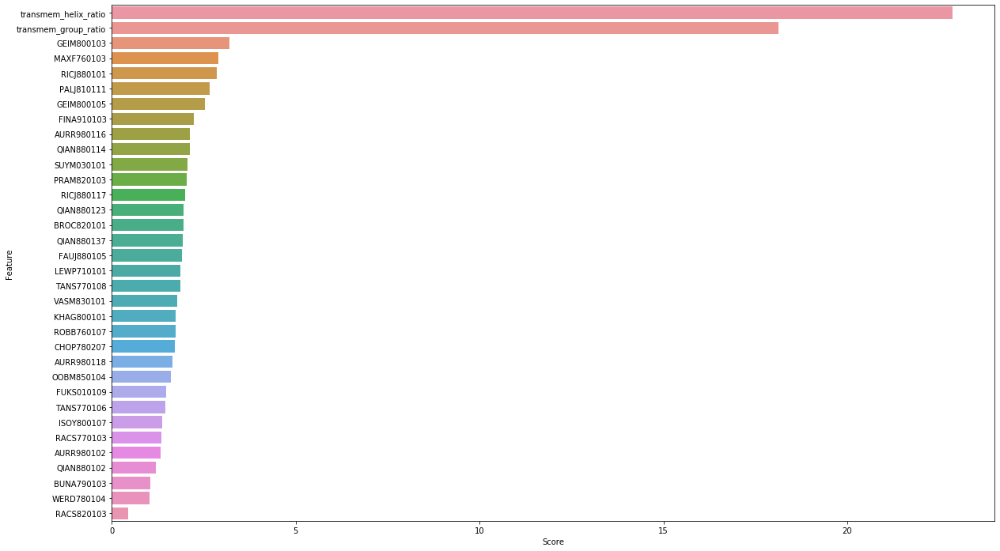

In [55]:

sns.barplot(x='Score',y='Feature',data=feature_score)

In [110]:
shap_values = model.get_feature_importance(train_dataset, fstr_type='ShapValues')

In [111]:
expected_value = shap_values[0,-1]
shap_values_1 = shap_values[:,:-1]

In [169]:
shap_values[0]

array([[ 6.56449865e-02,  2.25138986e-02,  8.80383394e-02,
         2.01246711e-02,  1.10341470e-02,  6.33878510e-03,
         5.89518002e-02,  1.99412973e-01,  2.19874694e-02,
         5.22410086e-04,  1.65241485e-01,  2.46737924e-02,
         1.14541349e-01,  2.21681163e-02, -1.39603783e-02,
        -1.25623479e-02,  2.94536957e-01,  1.05541492e-01,
         1.22986860e-02,  1.49325575e-02,  3.91448451e-02,
         2.90440024e-02,  1.91157929e-02,  1.94233084e-02,
        -2.20124622e-02,  1.28800305e-01,  1.51025687e-02,
         5.58347595e-02,  2.53560981e-02,  3.10386907e-02,
        -1.74157397e-02,  7.39734814e-03,  6.44252660e-02,
         1.73752271e-01,  4.88861124e-01],
       [-6.15662985e-02, -1.71878057e-02, -9.72044496e-02,
        -7.27952714e-03, -1.04286174e-02, -7.92025181e-04,
        -1.23545404e-01, -1.49698234e-01, -1.50624861e-02,
         7.62212039e-02, -1.76989273e-01, -1.99396370e-02,
        -1.74519165e-01,  9.92554863e-03,  1.01527610e-01,
         2.86

In [121]:
X_train.columns=X.columns

,AURR980102,AURR980116,AURR980118,BROC820101,BUNA790103,CHOP780207,FAUJ880105,FINA910103,FUKS010109,GEIM800103,...,RICJ880101,RICJ880117,ROBB760107,SUYM030101,TANS770106,TANS770108,VASM830101,WERD780104,transmem_group_ratio,transmem_helix_ratio
2872,0.018119,0.010102,0.019058,0.400483,0.018383,0.028105,0.017264,0.016783,0.009556,0.016554,...,0.025102,0.036766,0.375644,0.585101,0.043099,0.079695,0.028524,0.828794,0.180743,0.407358
42413,0.033892,0.017798,0.038609,0.440258,0.000000,0.008821,0.038571,0.055128,0.003557,0.043685,...,0.043010,0.152996,0.358374,0.651820,0.045612,0.090638,0.035439,0.816012,0.069442,0.016461
43393,0.034140,0.033814,0.032614,0.413730,0.000000,0.024008,0.031000,0.044308,0.006794,0.025834,...,0.008987,0.000000,0.371752,0.610893,0.040587,0.040448,0.041356,0.849901,0.069931,0.038935
20286,0.035966,0.031675,0.057141,0.355237,0.101562,0.126885,0.091294,0.130484,0.006886,0.079138,...,0.054782,0.052759,0.484015,0.708937,0.135346,0.000000,0.079454,0.869746,0.208729,0.000000
6896,0.077426,0.080444,0.058414,0.378537,0.082606,0.185084,0.076047,0.130755,0.023990,0.054913,...,0.091928,0.165212,0.354539,0.590503,0.121437,0.148180,0.081797,0.789408,0.112260,0.000000
13103,0.033490,0.017585,0.038149,0.439827,0.000000,0.008711,0.038106,0.054463,0.003514,0.043167,...,0.042498,0.151203,0.358687,0.651028,0.045062,0.089576,0.035020,0.816393,0.099151,0.121149
33994,0.022591,0.011834,0.025669,0.428165,0.000000,0.005755,0.025502,0.036450,0.002358,0.029139,...,0.028641,0.102646,0.367177,0.629571,0.030153,0.060810,0.023658,0.826737,0.127890,0.170540
51168,0.032774,0.017208,0.037329,0.439061,0.000000,0.008517,0.037278,0.053280,0.003438,0.042246,...,0.041588,0.148014,0.359245,0.649619,0.044083,0.087687,0.034274,0.817073,0.100146,0.000000
16186,0.029435,0.015445,0.033505,0.435488,0.000000,0.007611,0.033416,0.047761,0.003084,0.037947,...,0.037342,0.133136,0.361846,0.643044,0.039514,0.078872,0.030792,0.820242,0.120724,0.062907
21720,0.032416,0.028555,0.051500,0.359944,0.091659,0.114466,0.082281,0.117602,0.006207,0.071371,...,0.049378,0.047615,0.474373,0.696776,0.122017,0.000000,0.071672,0.867684,0.163402,0.099135


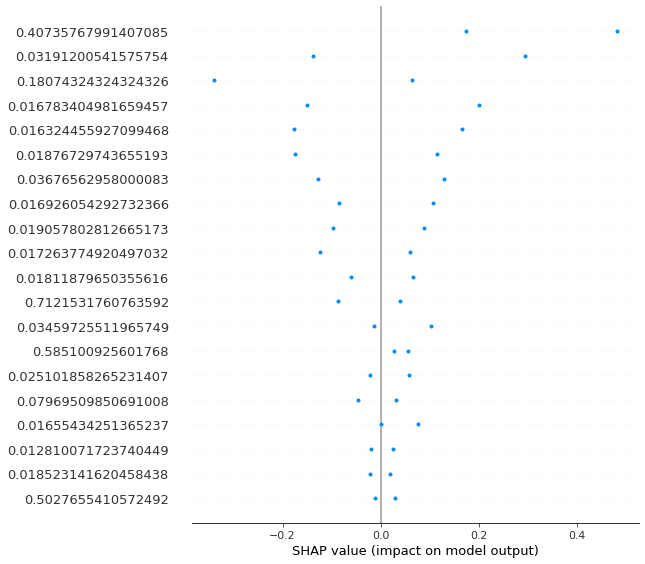

In [122]:
shap.summary_plot(shap_values_1[0][:,:-1],X_train.iloc[0,:])

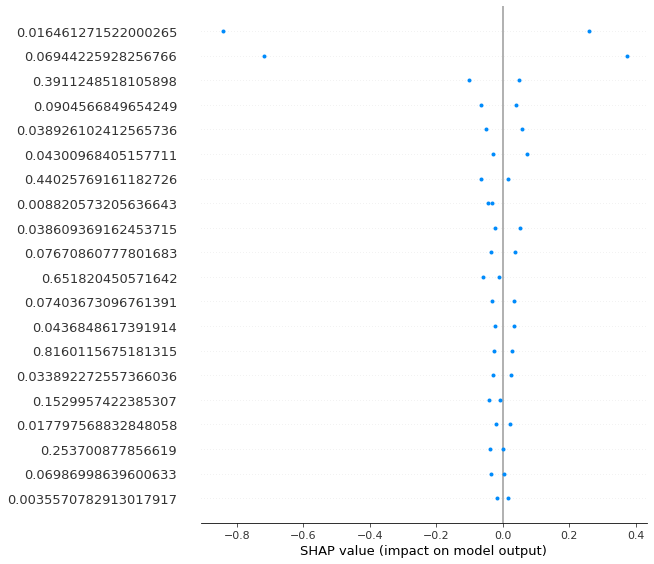

In [113]:
shap.summary_plot(shap_values_1[1][:,:-1],X_train.iloc[1,:])

In [22]:
#shap values explainer
shap.initjs()


In [41]:
w = catboost.MetricVisualizer('./bio-catboost-multi-resample')
w.start()

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

In [99]:
#cross validation
params = {"iterations": 1500,
          "depth": 6,
          'custom_metric':['Precision','Recall','F1','Accuracy','MCC'],
          "loss_function": "MultiClass",
          "verbose": False}

scores = cv(train_dataset,
            params,
            fold_count=5, 
            plot="True")

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

In [59]:
X_test.columns=X_train.columns

In [31]:
# Get predicted classes
preds_class = model.predict(X_test)

In [76]:
m =confusion_matrix(y_test,preds_class,labels=[0,1,2])
m

array([[4749,  233, 1662],
       [   0, 6580,    0],
       [ 432,   63, 6081]])